__Instead of processing bee view images with an autoencoder as in previous notebooks, the bee's spike rate is now projected in the viewing area of the animal. After mapping multiple positions of the flight the map shows locations on the field which trigger high brain activity.__

In [ ]:
from skimage.io import imread
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from matplotlib.gridspec import GridSpec
import numpy as np
from enum import Enum

from bee_view_analyzer.ModelLoader import *
import bee_view_analyzer.Autoencoder as Autoencoder
import bee_view_analyzer.Correlation as Correlation
import bee_view_analyzer.DataLoader as DataLoader
import bee_view_analyzer.Utils as Utils
import bee_view_analyzer.Visualizer as Visualizer

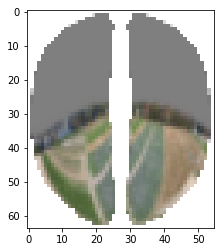

In [ ]:
path = Utils.get_path(["flights", "flight_2018_09_03#1"], "coords.dill")
coords = Utils.load_object(path)

path = Utils.get_path(["flights", "flight_2018_09_03#1"], "camera_positions.dill")
camera_positions = Utils.load_object(path)

path = Utils.get_path(["05_mapping"], "field_map.png")
field_map = Utils.load_object(path)

mask_path = Utils.get_path(['05_mapping'], 'compressed_mask.png')
compressed_mask = imread(mask_path)

plt.imshow(compressed_mask, cmap=plt.cm.gray)

In [ ]:
model_path = Utils.get_path(['02_autoencoder'], 'model.pt')
bee_view_image_path = Utils.get_path(["flights", "flight_2018_09_03#1", "bee_eye"])
batch_size = 128

model_loader = ModelLoader(Autoencoder, model_path, bee_view_image_path, batch_size = batch_size,
                           image_height = int(262 // 4.05), image_width = int(226 // 4.05))

In [ ]:
csv_file_path = Utils.get_path(['flights', 'flight_2018_09_03#1'],
                              '030918_01_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv')

neuro_spikes = DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 8, start_frame = 600)

In [ ]:
start_round_frames = [630, 2900, 4580]
end_round_frames = [2120, 4370, 6050]

start_flight_lines_round_1 = [630, 1190, 1570, 1921]
end_flight_lines_round_1 = [1034, 1385, 1720, 2117]

start_flight_lines_round_2 = [2900, 3462, 3786, 4183]
end_flight_lines_round_2 = [3300, 3651, 3979, 4368]

start_flight_lines_round_3 = [4580, 5135, 5481, 5866]
end_flight_lines_round_3 = [4981, 5327, 5646, 6050]

# Map one bee image on the field

__Bee view images are created by shooting raycasts from the copter agent in the viewing direction of the bee. Intersection points of these raycasts with the 3D model of the environment represent one pixel in the bee view image. Here, the coordinates of the intersection points are displayed on a map from top view. Each pixel on the map is assigned a color value of a pixel in the bee view image at the coordinate of the intersection point. Only pixels on the field are used (marked as green), while pixels which represent the surrounding environment (marked as red) and the gray backround are ignored.__

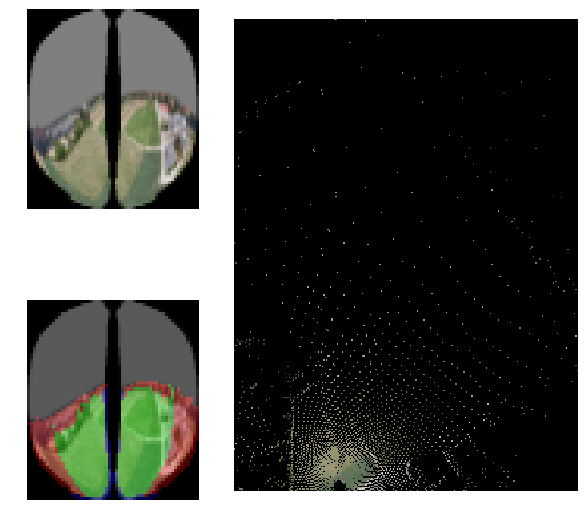

In [ ]:
_ = Visualizer.map_frame(model_loader, 630, coords, camera_positions, compressed_mask)

# Map a flight line

__The first flight line (see red flight trajectory) of the route is mapped as above. The mean is calculated of multiple assigned color values to one pixel on the map.__

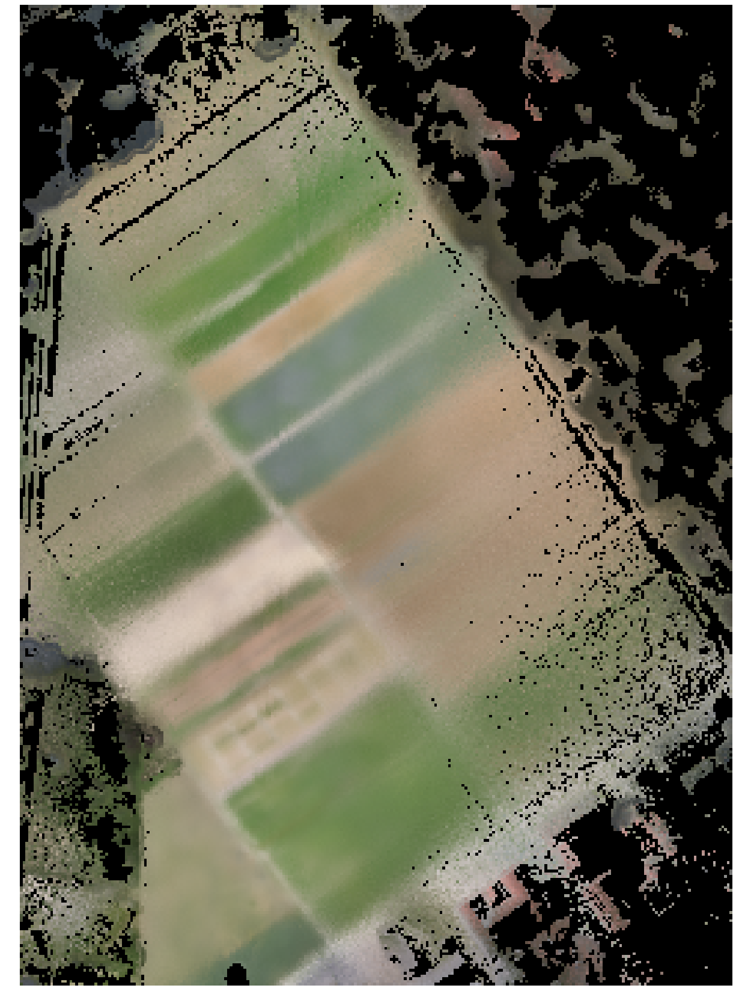

In [ ]:
_ = Visualizer.map_frames(Visualizer.MAP_FUNCTION.mean, model_loader,
                          start_flight_lines_round_1[0], end_flight_lines_round_1[0],
                          coords, mask = compressed_mask)

__Next, instead of calculating the mean color values are overwritten if they reach a small threshold.__

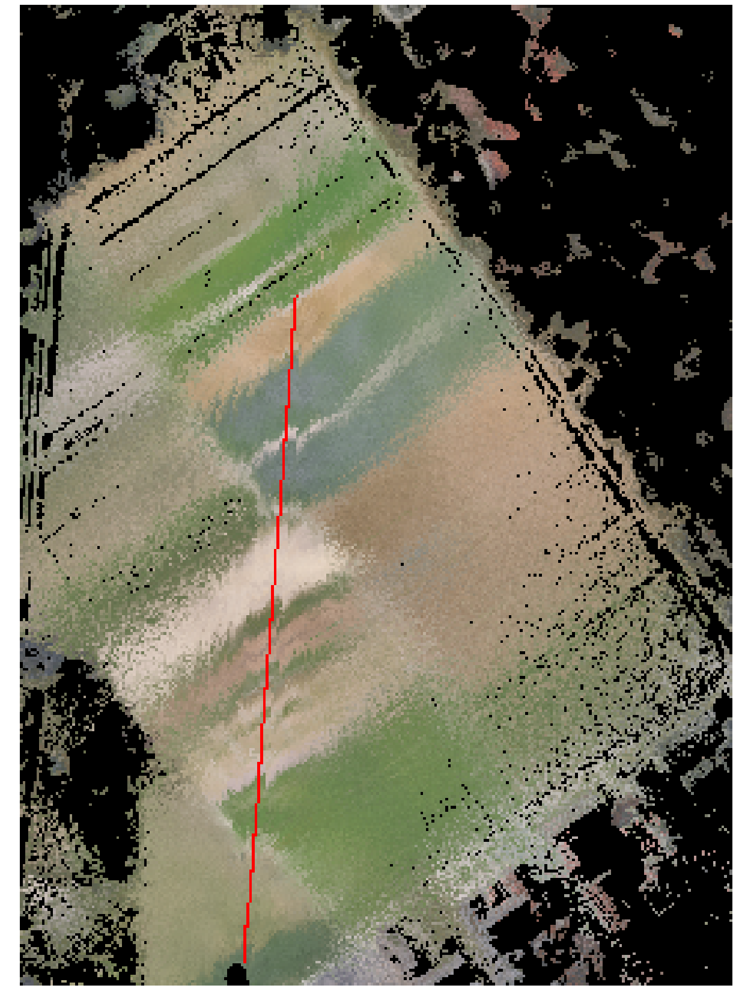

In [ ]:
_ = Visualizer.map_frames(Visualizer.MAP_FUNCTION.threshold, model_loader,
                          start_flight_lines_round_1[0], end_flight_lines_round_1[0],
                          coords, camera_positions, compressed_mask)

# Sliding Window Correlation

__Change color of the flight trajectory according to correlation values of a sliding window correlation (swc) of the spike rate. Start and end points of the part used as the sliding window are marked with white squares. A color value at a certain position x on the trajectory represents the pearson correlation of:__

__the sliding window and__

__the time series which starts at x and contains the next elements such that this time series is as long as the sliding window.__

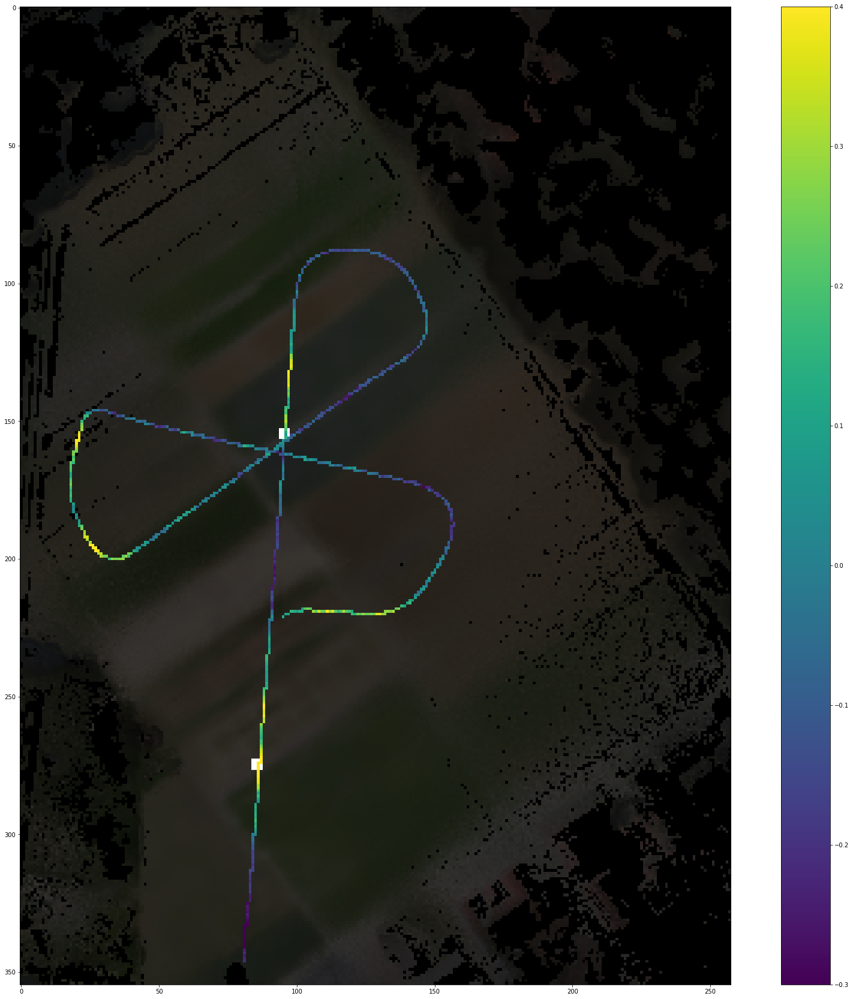

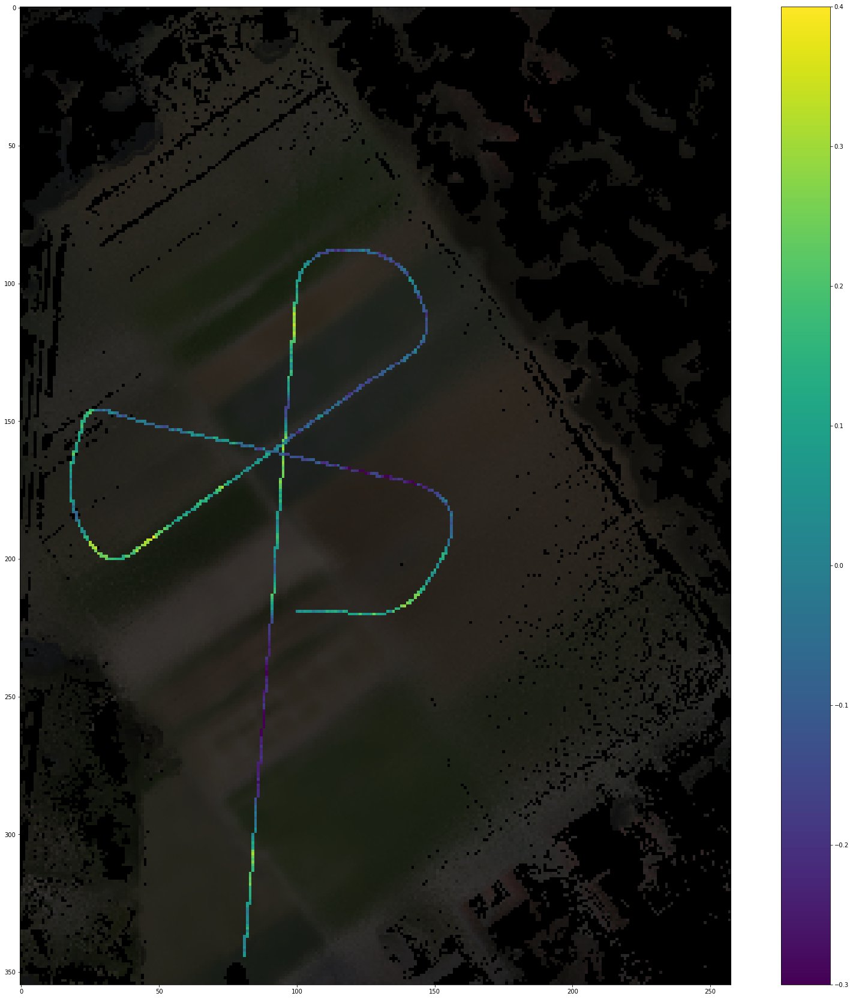

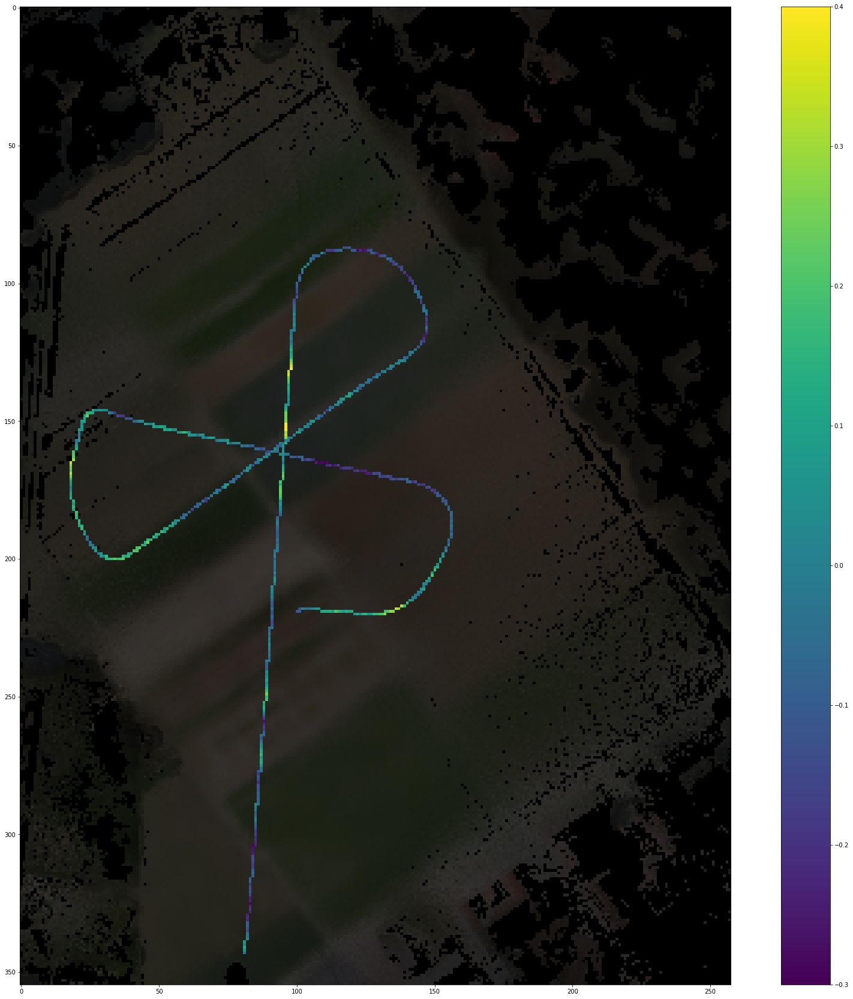

In [ ]:
def map_neuro_corr(corr_start_frame, corr_end_frame, round_num):
    start = start_round_frames[round_num]
    end = end_round_frames[round_num] - 230
    
    auto_corrs = Correlation.swc(neuro_spikes, corr_start_frame, corr_end_frame)
    Visualizer.map_swc(field_map, start, corr_start_frame, corr_end_frame, auto_corrs[start : end].numpy(),
                       camera_positions)
    
map_neuro_corr(750, 950, 0)
map_neuro_corr(750, 950, 1)
map_neuro_corr(750, 950, 2)

# Map Spike Rate

__Instead of mapping the color values of the 3D model (pixel colors in bee view image) the spike rate is used in this section. Since there is only one spike rate value per flight position all points in viewing range are assigned the same value. Again, different functions can be applied for overlapping spike rate values per pixel on the map (e.g. mean) when multiple frames are mapped.__

## First round of first flight

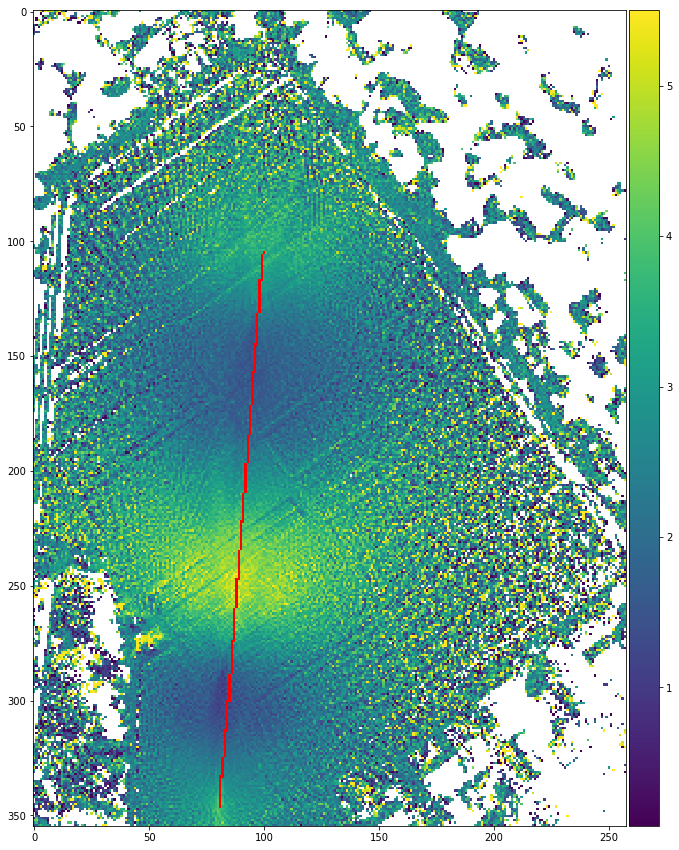

In [ ]:
# Mean of first flight line

_, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                          [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]], 
                          coords, camera_positions = camera_positions)

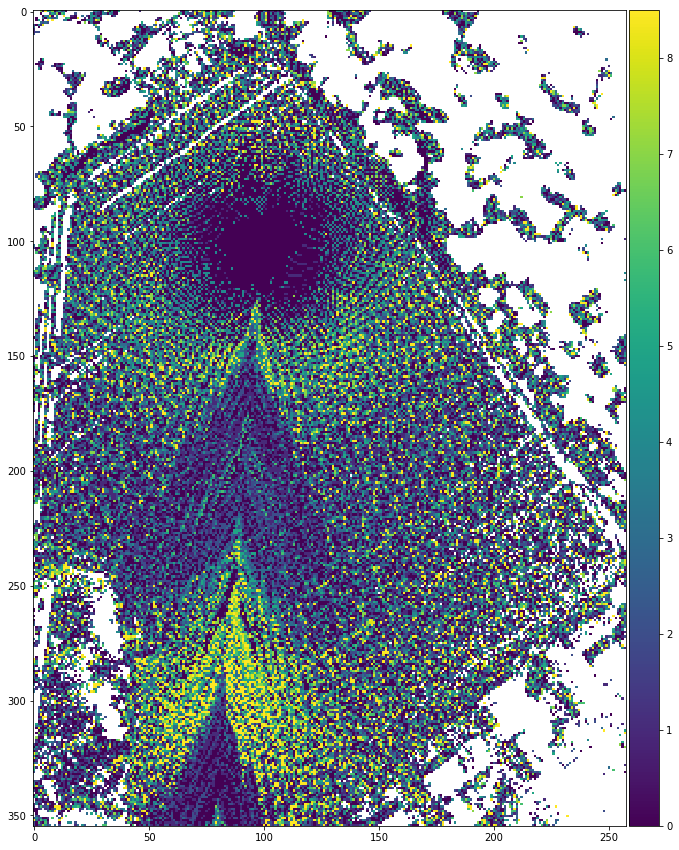

In [ ]:
# Overwriting values which have a minimum value (threshold)

_, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.threshold, neuro_spikes,
                          [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]], coords)

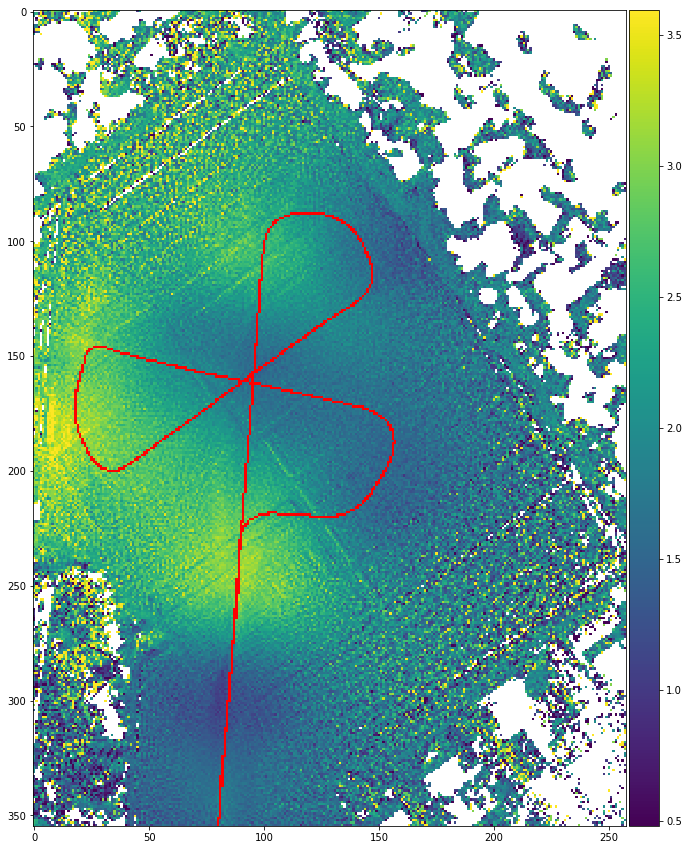

In [ ]:
# One round

_, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                          [start_round_frames[0]], [end_round_frames[0]],
                          coords, camera_positions = camera_positions)

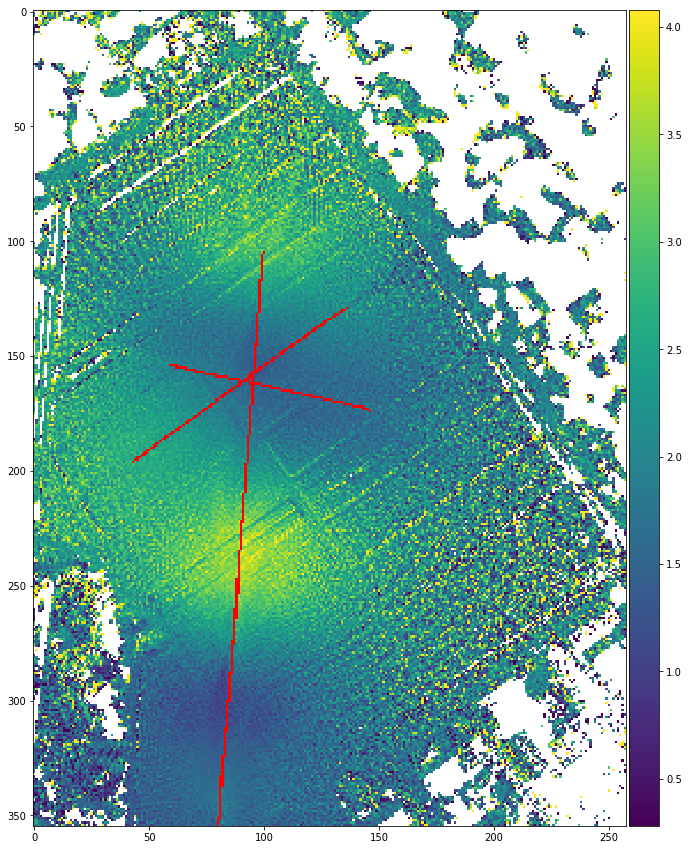

In [ ]:
# Only lines of one round (without turns)

_, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                          start_flight_lines_round_1, end_flight_lines_round_1,
                          coords, camera_positions = camera_positions)

In [ ]:
map1, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                    [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]],
                                    coords, camera_positions = camera_positions)

map2, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                    [start_round_frames[0]], [end_round_frames[0]],
                                    coords, camera_positions = camera_positions)

map3, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes, start_flight_lines_round_1,
                                    end_flight_lines_round_1, coords, camera_positions = camera_positions)

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_01.png")

Utils.add_fig_to_image(map1)
Utils.add_fig_to_image(map2, append_horizontal = True)
Utils.add_fig_to_image(map3, append_horizontal = True)
Utils.save_combined_image(path, show_image = False, combine_vertical = False)

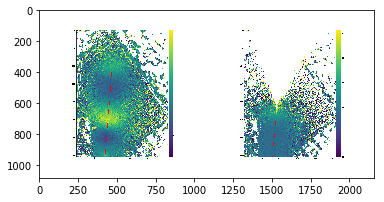

In [ ]:
map1, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                    [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]],
                                    coords, camera_positions = camera_positions)

map2, _ = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                    [start_flight_lines_round_1[3]], [end_flight_lines_round_1[3]],
                                    coords, camera_positions = camera_positions)

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_02.png")

Utils.add_fig_to_image(map1)
Utils.add_fig_to_image(map2, append_horizontal = True)
Utils.save_combined_image(path, show_image = True, combine_vertical = False)

## All rounds of first flight

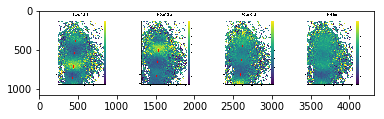

In [ ]:
map_1_fig, map1 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]],
                                            coords, camera_positions = camera_positions, title = "Round 1")
map_2_fig, map2 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_flight_lines_round_2[0]], [end_flight_lines_round_2[0]],
                                            coords, camera_positions = camera_positions, title = "Round 2")
map_3_fig, map3 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_flight_lines_round_3[0]], [end_flight_lines_round_3[0]],
                                            coords, camera_positions = camera_positions, title = "Round 3")
mean_map = Visualizer.get_mean_map((map1, map2, map3))

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_rounds_01.png")

Utils.add_fig_to_image(map_1_fig)
Utils.add_fig_to_image(map_2_fig, append_horizontal = True)
Utils.add_fig_to_image(map_3_fig, append_horizontal = True)
Utils.add_fig_to_image(mean_map, append_horizontal = True)
Utils.save_combined_image(path, show_image = True, combine_vertical = False)

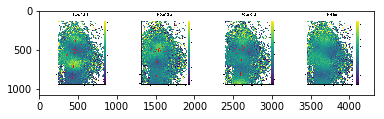

In [ ]:
map_1_fig, map1 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            start_flight_lines_round_1, end_flight_lines_round_1,
                                            coords, camera_positions = camera_positions, title = "Round 1")
map_2_fig, map2 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            start_flight_lines_round_2, end_flight_lines_round_2,
                                            coords, camera_positions = camera_positions, title = "Round 2")
map_3_fig, map3 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            start_flight_lines_round_3, end_flight_lines_round_3,
                                            coords, camera_positions = camera_positions, title = "Round 3")
mean_map = Visualizer.get_mean_map((map1, map2, map3))

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_rounds_02.png")

Utils.add_fig_to_image(map_1_fig)
Utils.add_fig_to_image(map_2_fig, append_horizontal = True)
Utils.add_fig_to_image(map_3_fig, append_horizontal = True)
Utils.add_fig_to_image(mean_map, append_horizontal = True)
Utils.save_combined_image(path, show_image = True, combine_vertical = False)

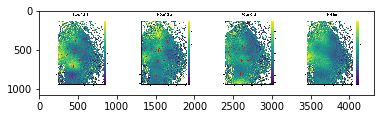

In [ ]:
map_1_fig, map1 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_round_frames[0]], [end_round_frames[0]],
                                            coords, camera_positions = camera_positions, title = "Round 1")
map_2_fig, map2 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_round_frames[1]], [end_round_frames[1]],
                                            coords, camera_positions = camera_positions, title = "Round 2")
map_3_fig, map3 = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean, neuro_spikes,
                                            [start_round_frames[2]], [end_round_frames[2]],
                                            coords, camera_positions = camera_positions, title = "Round 3")
mean_map = Visualizer.get_mean_map((map1, map2, map3))

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_rounds_03.png")

Utils.add_fig_to_image(map_1_fig)
Utils.add_fig_to_image(map_2_fig, append_horizontal = True)
Utils.add_fig_to_image(map_3_fig, append_horizontal = True)
Utils.add_fig_to_image(mean_map, append_horizontal = True)
Utils.save_combined_image(path, show_image = True, combine_vertical = False)

## All rounds of 4 flights

In [ ]:
neuro_data_flights = [neuro_spikes]
coord_flights = [coords]
camera_position_flights = [camera_positions]

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#2"],
                               "030918_2_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
neuro_data_flights.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#3"],
                               "030918_3_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
neuro_data_flights.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

csv_file_path = Utils.get_path(["flights", "flight_2018_09_03#4"],
                               "030918_4_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv")
neuro_data_flights.append(DataLoader.load_neuro_data(None, csv_file_path, spike_type_row = 2, start_frame = 600))

path = Utils.get_path(["flights", "flight_2018_09_03#2"], "coords.dill")
coord_flights.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#3"], "coords.dill")
coord_flights.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#4"], "coords.dill")
coord_flights.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#2"], "camera_positions.dill")
camera_position_flights.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#3"], "camera_positions.dill")
camera_position_flights.append(Utils.load_object(path))

path = Utils.get_path(["flights", "flight_2018_09_03#4"], "camera_positions.dill")
camera_position_flights.append(Utils.load_object(path))

start_rounds_flights = [start_round_frames,
                       [743, 2390, 4070, 5770],
                       [110, 1950, 3650, 5330],
                       [330, 1980, 3650, 5330]]
end_rounds_flights = [end_round_frames,
                     [2220, 3880, 5555, 7220],
                     [1600, 3440, 5150, 6795],
                     [1800, 3450, 5120, 6750]]

start_line_flights = [[start_flight_lines_round_1, start_flight_lines_round_2, start_flight_lines_round_3],
        [[743, 1300, 1630, 2025], [2390, 2965, 3310, 3700], [4070, 4640, 4970, 5370], [5770, 6315, 6665, 7050]],
        [[110, 650, 1000, 1400], [1950, 2500, 2850, 3240], [3650, 4200, 4550, 4930], [5330, 5870, 6215, 6600]],
        [[330, 870, 1200, 1590], [1980, 2530, 2870, 3250], [3650, 4200, 4530, 4920], [5330, 5870, 6220, 6480]]]

end_line_flights = [[end_flight_lines_round_1, end_flight_lines_round_2, end_flight_lines_round_3],
        [[1145, 1490, 1815, 2220], [2805, 3165, 3485, 3880], [4480, 4820, 5145, 5555], [6150, 6505, 6825, 7220]],
        [[510, 870, 1200, 1600], [2350, 2720, 3050, 3440], [4070, 4420, 4750, 5150], [5740, 6070, 6420, 6795]],
        [[740, 1070, 1400, 1800], [2400, 2750, 3070, 3450], [4050, 4400, 4730, 5120], [5740, 6090, 6410, 6750]]]

In [ ]:
def save_maps(flight_count, mode, save_path, show_image = True, leave_out_frames = -1, add_round_3 = True):
    for flight_num in range(flight_count):
        round_maps = []
        round_map_figs = []
        
        for round_num in range(len(start_line_flights[flight_num])):
            if mode == 0:
                map_fig, map_array = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean,
                                neuro_data_flights[flight_num],
                                [start_line_flights[flight_num][round_num][0]],
                                [end_line_flights[flight_num][round_num][0]],
                                coord_flights[flight_num],
                                camera_positions = camera_position_flights[flight_num],
                                leave_out_frames = leave_out_frames,
                                title = "Round {}".format(round_num) if flight_num == 0 else None)
            elif mode == 1:
                map_fig, map_array = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean,
                                neuro_data_flights[flight_num],
                                start_line_flights[flight_num][round_num],
                                end_line_flights[flight_num][round_num],
                                coord_flights[flight_num],
                                camera_positions = camera_position_flights[flight_num],
                                leave_out_frames = leave_out_frames,
                                title = "Round {}".format(round_num) if flight_num == 0 else None)
            elif mode == 2:
                map_fig, map_array = Visualizer.map_spike_rate(Visualizer.MAP_FUNCTION.mean,
                                neuro_data_flights[flight_num],
                                [start_rounds_flights[flight_num][round_num]],
                                [end_rounds_flights[flight_num][round_num]],
                                coord_flights[flight_num],
                                camera_positions = camera_position_flights[flight_num],
                                leave_out_frames = leave_out_frames,
                                title = "Round {}".format(round_num) if flight_num == 0 else None)
            
            round_maps.append(map_array)
            round_map_figs.append(map_fig)
        
        title = "mean" if flight_num == 0 else None
        mean_map = Visualizer.get_mean_map(round_maps, title = title)
        
        Utils.add_fig_to_image(mean_map)
        
        for fig in round_map_figs:
            Utils.add_fig_to_image(fig, append_horizontal = True)
            
        if add_round_3 and flight_num == 0:
            fig = figure(figsize = (15,15))
            plt.suptitle("Round 3", fontsize=48)
            Utils.add_fig_to_image(fig, append_horizontal = True)
        
    Utils.save_combined_image(save_path, show_image = show_image)

In [ ]:
# If Utils.add_fig_to_image() was used previously but there was an error and Utils.save_combined_image() did not
# execute properly Utils._clear_combined_images() must be used to clear added figures.
Utils._clear_combined_images()

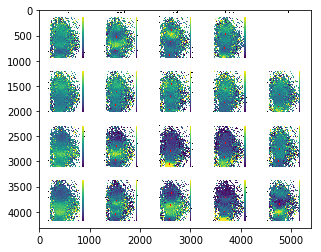

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_01.png")
save_maps(4, 0, path)

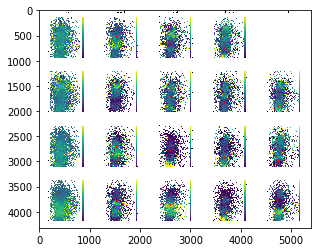

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_10th_frame_01.png")
save_maps(4, 0, path, leave_out_frames = 10)

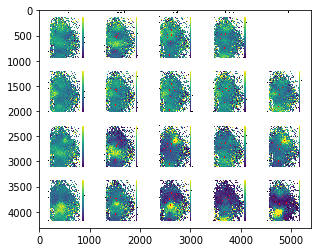

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_02.png")
save_maps(4, 1, path)

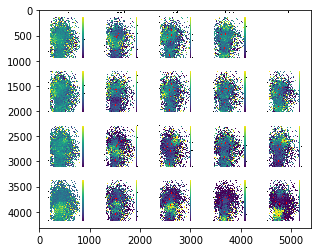

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_10th_frame_02.png")
save_maps(4, 1, path, leave_out_frames = 10)

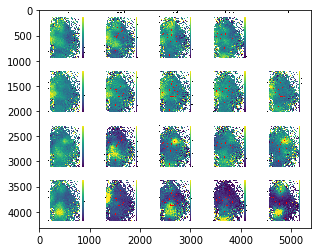

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_03.png")
save_maps(4, 2, path)

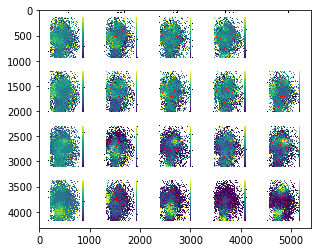

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_multiple_flights_10th_frame_03.png")
save_maps(4, 2, path, leave_out_frames = 10)

## Map with log(spike)

In [ ]:
def show_log_map(start_frames, end_frames):
    map_matrix = Visualizer.get_spike_rate_map_matrix(neuro_spikes, start_frames, end_frames, coords)
    
    Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.mean, start_frames, end_frames,
                                  camera_positions = camera_positions, use_log = True)

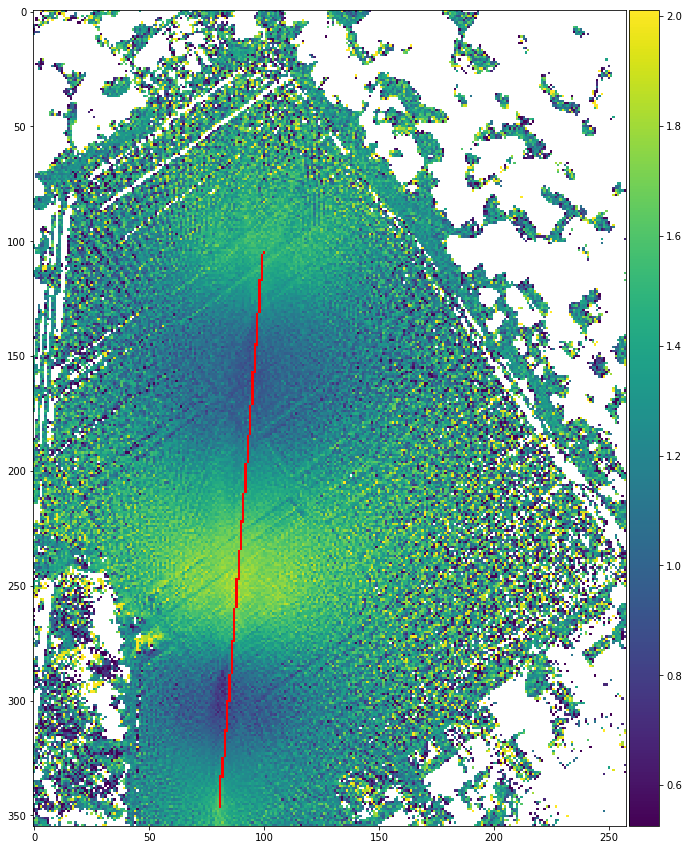

In [ ]:
show_log_map([start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]])

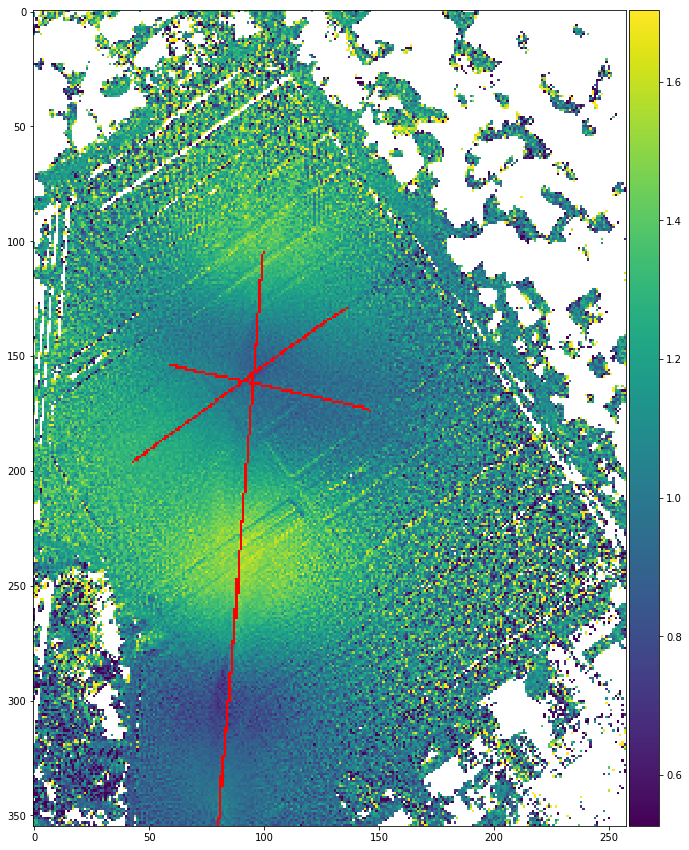

In [ ]:
show_log_map(start_flight_lines_round_1, end_flight_lines_round_1)

## Min, Max, Std, Var

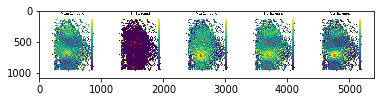

In [ ]:
map_matrix = Visualizer.get_spike_rate_map_matrix(neuro_spikes, start_flight_lines_round_1,
                                                  end_flight_lines_round_1, coords)

mean_fig, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.mean,
                                               start_flight_lines_round_1, end_flight_lines_round_1,
                                               camera_positions, title = "Mean 1st round")

min_fig, _, _  = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.min, start_flight_lines_round_1,
                                               end_flight_lines_round_1, camera_positions, title = "Min 1st round")

max_fig, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.max, start_flight_lines_round_1,
                                              end_flight_lines_round_1, camera_positions, title = "Max 1st round")

std_fig, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.std, start_flight_lines_round_1,
                                              end_flight_lines_round_1, camera_positions, title = "Std 1st round")

var_fig, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.var, start_flight_lines_round_1,
                                              end_flight_lines_round_1, camera_positions, title = "Var 1st round")

Utils.add_fig_to_image(mean_fig)
Utils.add_fig_to_image(min_fig, append_horizontal = True)
Utils.add_fig_to_image(max_fig, append_horizontal = True)
Utils.add_fig_to_image(std_fig, append_horizontal = True)
Utils.add_fig_to_image(var_fig, append_horizontal = True)

path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_min_max_std_var.png")
Utils.save_combined_image(path, show_image = True)

## Percentile of all 4 flights

__Data in section 4.3 must be loaded!__

In [ ]:
def calculate_map_matrices():
    matrices = []
    
    for flight_num in range(len(neuro_data_flights)):
        for round_num in range(len(start_rounds_flights[flight_num])):
            map_matrix = Visualizer.get_spike_rate_map_matrix(neuro_data_flights[flight_num],
                                                              start_line_flights[flight_num][round_num],
                                                              end_line_flights[flight_num][round_num],
                                                              coord_flights[flight_num])
            
            matrices.append(map_matrix)
            
    return matrices

def save_maps(map_matrices, mode, save_path):
    i = 0
    
    for flight_num in range(len(neuro_data)):
        flight_figs = []
        
        for round_num in range(len(start_rounds_flights[flight_num])):
            if mode == 0:
                map_function = Visualizer.MAP_FUNCTION.mean
            elif mode == 1:
                map_function = Visualizer.MAP_FUNCTION.percentile5
            elif mode == 2:
                map_function = Visualizer.MAP_FUNCTION.median
            else:
                map_function = Visualizer.MAP_FUNCTION.percentile95
                
            title = "Round {}".format(round_num) if flight_num == 0 else None

            

            fig, _, _ = Visualizer.get_spike_rate_map(map_matrices[i],
                                                      map_function,
                                                      start_line_flights[flight_num][round_num],
                                                      end_line_flights[flight_num][round_num],
                                                      camera_position_flights[flight_num],
                                                      title = title)
                        
            flight_figs.append(fig)
            i += 1
            
        first = True
        for fig in flight_figs:
            if first:
                first = False
                Utils.add_fig_to_image(fig)
            else:
                Utils.add_fig_to_image(fig, append_horizontal = True)
                
        if flight_num == 0:
            fig = figure(figsize = (15,15))
            plt.suptitle("Round 3", fontsize=48)
            Utils.add_fig_to_image(fig, append_horizontal = True)

    Utils.save_combined_image(save_path, show_image = True)

In [ ]:
map_matrices = calculate_map_matrices()

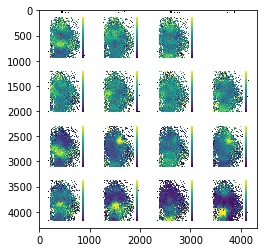

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_lines_percentile_01_mean.png")
save_maps(map_matrices, 0, path)

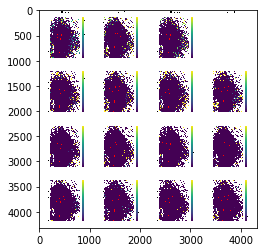

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_lines_percentile_02_percentile5.png")
save_maps(map_matrices, 1, path)

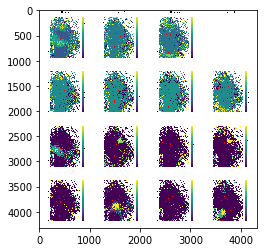

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_lines_percentile_03_median.png")
save_maps(map_matrices, 2, path)

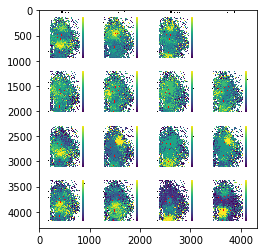

In [ ]:
path = Utils.get_path(["05_mapping", "results"], "map_spike_rates_lines_percentile_04_percentile95.png")
save_maps(map_matrices, 3, path)

## Number of assigned spike rate values per pixel

__Visualize how often pixels on the map are in the viewing range over one flight round. In other words, how many spike rate values are assigned to specific pixels.__

__Data in section 4.3 must be loaded!__

In [ ]:
flight_labels = ["03.09.2018 flight {}".format(i) for i in range(1, 5)]

def show_map_data_points_std(flight_num, use_only_lines):
    fig = figure(constrained_layout=True, figsize = (30,30), facecolor='white')
    fig.suptitle(flight_labels[flight_num], fontsize=50, fontweight='bold', y=1.08)

    rows = len(start_rounds_flights[flight_num])
    cols = 6

    gs = GridSpec(rows, cols, figure=fig)
    
    for round_num in range(rows):
        if use_only_lines:
            start_lines = start_line_flights[flight_num][round_num]
            end_lines = end_line_flights[flight_num][round_num]
        else:
            start_lines = [start_rounds_flights[flight_num][round_num]]
            end_lines = [end_rounds_flights[flight_num][round_num]]
            
        cam = camera_positions[flight_num][round_num]

        map_matrix = Visualizer.get_spike_rate_map_matrix(neuro_data_flights[flight_num], start_lines, end_lines,
                                                          coord_flights[flight_num])

        ax = fig.add_subplot(gs[round_num, 0])        
        title = "Mean" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.mean, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)
        
        ax.annotate("Round {}".format(round_num + 1), (0, 0.5), xytext=(-45, 0), ha='right', va='center',
                size=40, rotation=90, xycoords='axes fraction',
                textcoords='offset points')
        
        ax = fig.add_subplot(gs[round_num, 1])
        title = "Min" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.min, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)

        ax = fig.add_subplot(gs[round_num, 2])
        title = "Max" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.max, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)

        ax = fig.add_subplot(gs[round_num, 3])
        title = "Std" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.std, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)

        ax = fig.add_subplot(gs[round_num, 4])
        title = "Var" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.var, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)
        
        ax = fig.add_subplot(gs[round_num, 5])
        title = "Count" if round_num == 0 else None
        _, _, _ = Visualizer.get_spike_rate_map(map_matrix, Visualizer.MAP_FUNCTION.count, start_lines,
                                                end_lines, camera_position_flights[flight_num],
                                                title = title, ax = ax)
        
    plt.tight_layout()

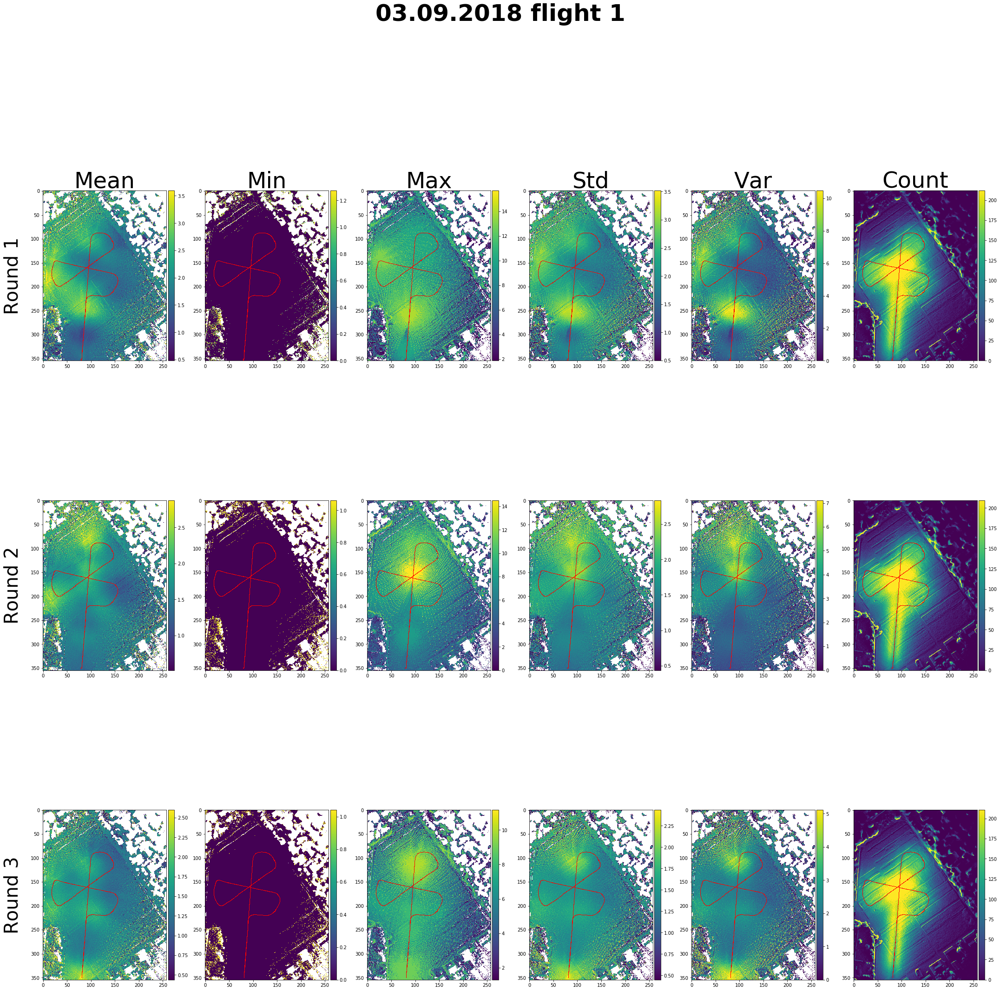

In [ ]:
show_map_data_points_std(0, False)

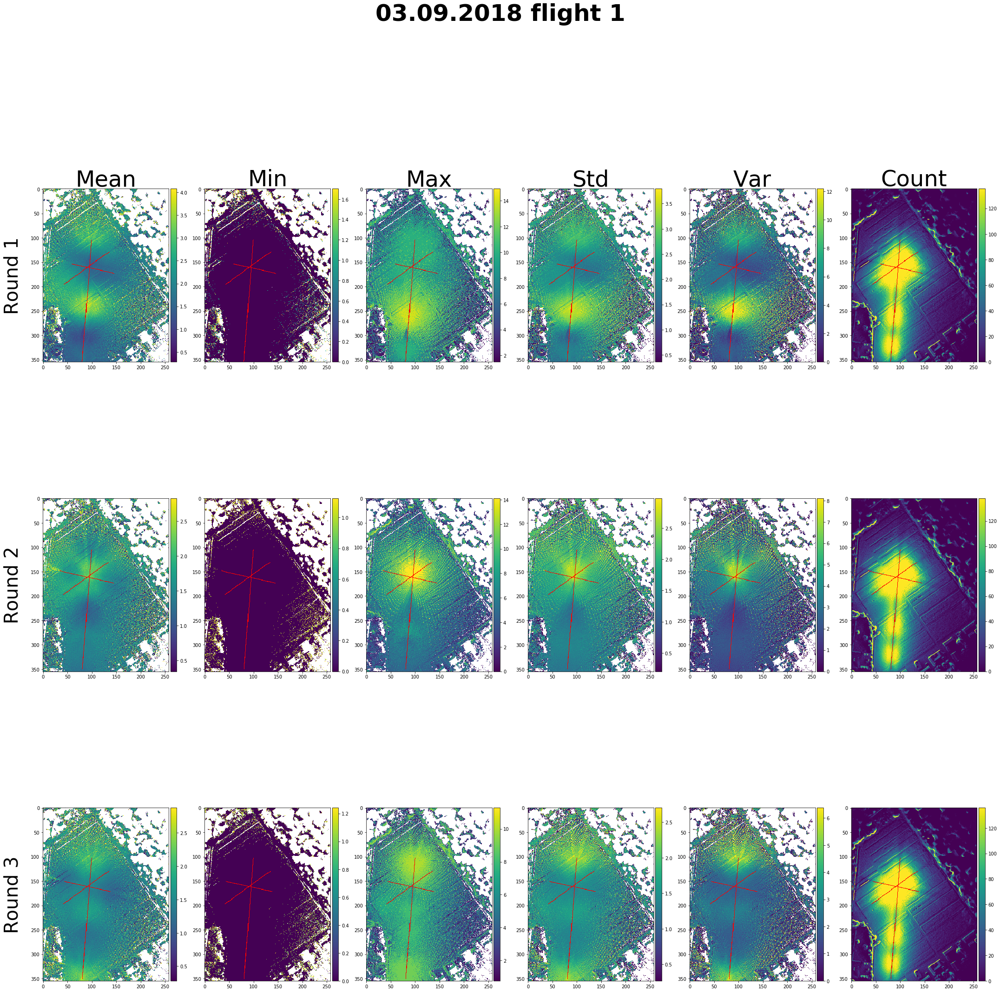

In [ ]:
show_map_data_points_std(0, True)

# Map activations

__Process bee view images by the autoencoder from previous notebooks. Use activations of the resulting activation maps for projection instead of the spike rate.__

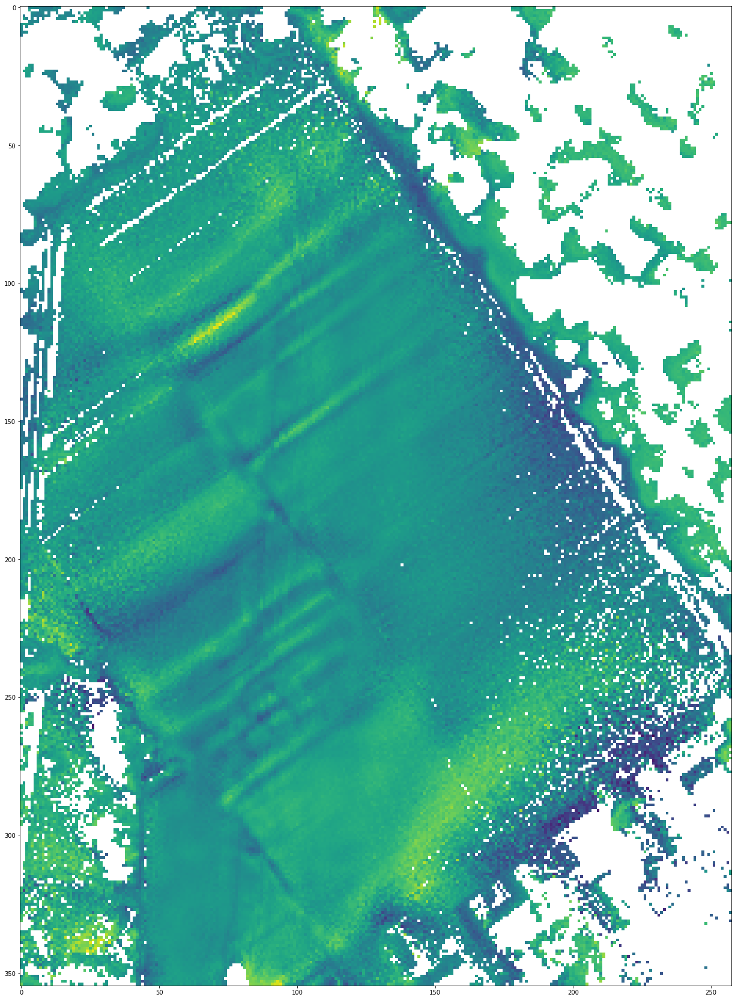

In [ ]:
fig, _ = Visualizer.map_activation_map(Visualizer.MAP_FUNCTION.mean, 0, 0, model_loader,
                                       start_flight_lines_round_1[0], end_flight_lines_round_1[0], coords,
                                       fig_size = 30, show_colorbar = False, mask = compressed_mask)

plt.show()

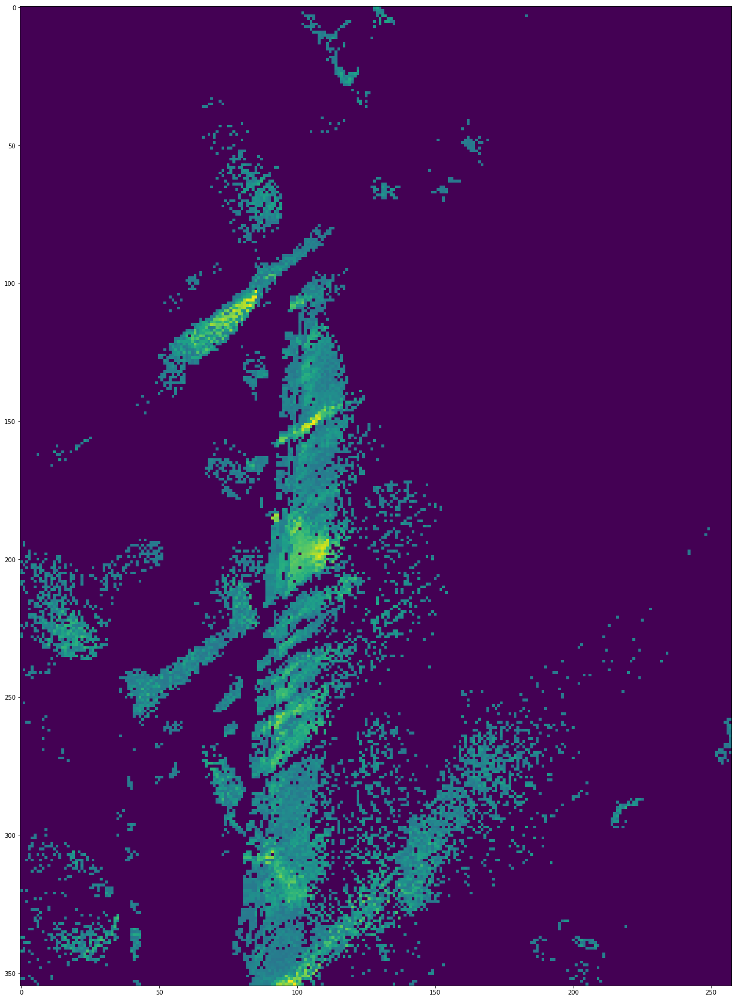

In [ ]:
fig, _ = Visualizer.map_activation_map(Visualizer.MAP_FUNCTION.threshold, 0, 0, model_loader,
                                       start_flight_lines_round_1[0], end_flight_lines_round_1[0], coords,
                                       fig_size = 30, show_colorbar = False, mask = compressed_mask)

plt.show()

# Multiple samples per omnitidia

__Previous sections use only one raycast per ommatidium (one raycast per pixel in bee view image). But the colors shown in the bee view images are created by shooting multiple raycasts and calculating one color of all resulting colors at intersection points of raycasts and 3D model. In this section, all intersection points are used for mapping.__

In [ ]:
def load_coords(start_frame):
    file_dir = ["flights", "flight_2018_09_03#1", "coords_multiple_ray_casts"]
    file_name = "coords_with_samples_" + str(start_frame // 100) + ".dill"
    path = Utils.get_path(file_dir, file_name)
    
    print("    Loading file: " + file_name)
    
    return Utils.load_object(path)

def map_frame_samples(model_loader, frame_num, camera_positions, mask_overlay = None):
    coords = load_coords(frame_num)
        
    frame_coord = coords[frame_num % 100]
    camera_position = camera_positions[frame_num]
    
    for i_batch, (xb, yb) in enumerate(model_loader.data_loader):    
        xbd = xb.data
        
        if ((i_batch + 1) * model_loader.batch_size) > frame_num:
            break
            
    img = xbd[frame_num % model_loader.batch_size].data.numpy()
    img = np.transpose(img, (1, 2, 0))
    
    mask = np.zeros((img.shape[0], img.shape[1], img.shape[2]))
    
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    img_map = np.zeros((355, 258, 3))
    
    for coord_omnatidium in frame_coord:
        image_coord = coord_omnatidium[0]
        
        # divide by 2 since bee images are scaled down for autoencoder
        bee_x = min(img.shape[1] - 1, int(image_coord[0] // 2))
        bee_y = min(img.shape[0] - 1, int(image_coord[1] // 2))
        
        # mark red pixel
        mask[bee_y][bee_x] = np.array([1.0, 0.0, 0.0])
        
        for i in range(1, len(coord_omnatidium)):
            coord = coord_omnatidium[i]
        
            x = int(delta_x + np.around(coord[0]))
            y = int(delta_y - np.around(coord[2]))
        
            if y < 0 or x < 0 or y >= img_map.shape[0] or x >= img_map.shape[1]:
                continue
        
            mask[bee_y][bee_x] = np.array([0.0, 0.0, 1.0])
        
            if mask_overlay is not None and np.array_equal(mask_overlay[bee_y][bee_x], np.array([255, 255, 255, 255])):
                continue
        
            # mark green pixel
            mask[bee_y][bee_x] = np.array([0.0, 1.0, 0.0])
        
            img_map[y, x] = img[bee_y][bee_x]
    
    # camera position
    img_map[delta_y - int(camera_position[2]), delta_x + int(camera_position[0])] = np.array((1.0, 0.0, 0.0))
    
    figure(figsize = (10,10))    
    plt.imshow(img)
    plt.show()
    
    if mask_overlay is not None:
        figure(figsize = (10,10))
        plt.imshow(img)
        plt.imshow(mask, alpha = 0.3)    
        plt.show()
    
    figure(figsize = (30,30))
    plt.imshow(img_map)
    plt.show()
    
    return img_map

    Loading file: coords_with_samples_6.dill


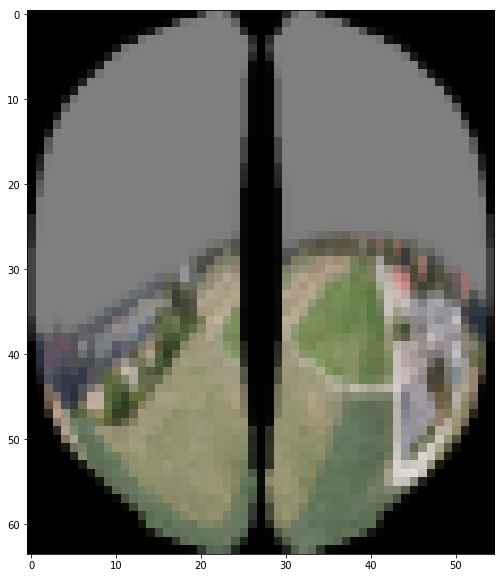

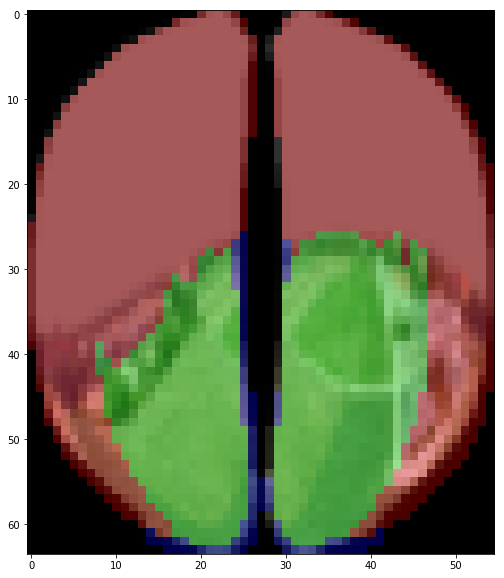

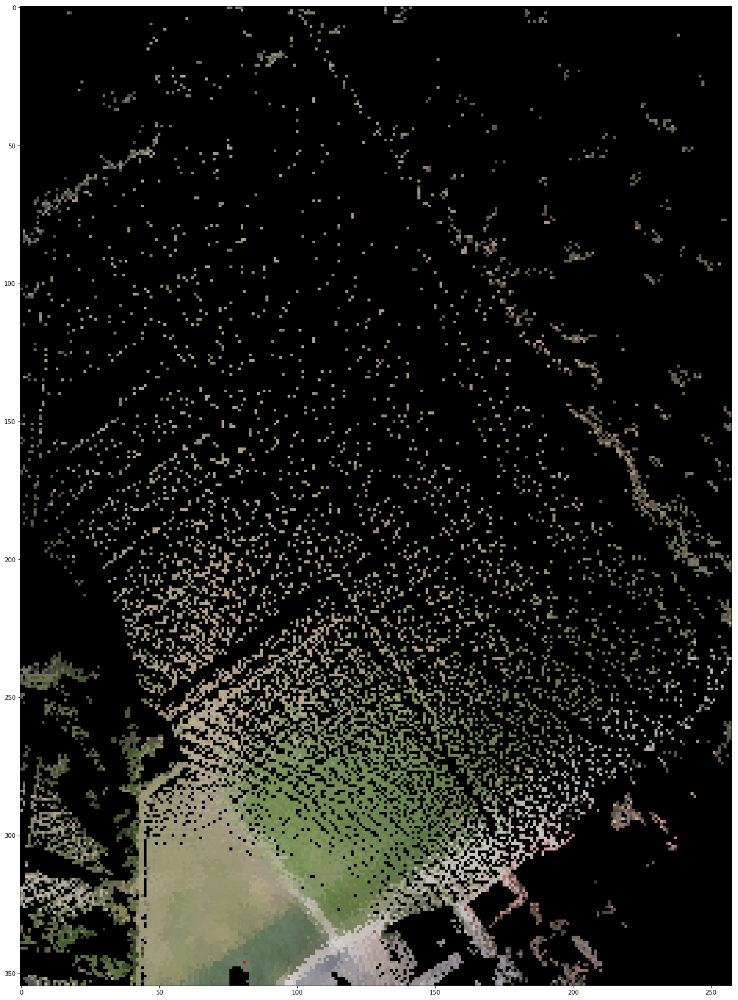

In [ ]:
_ = map_frame_samples(model_loader, 630, camera_positions, compressed_mask)

In [ ]:
MAP_FUNCTION = Enum('MapFunctions', 'mean threshold')

def map_spike_rate_samples(map_function, spike_rate, start_frames, end_frames, camera_positions = None, show_colorbar = True, title = None):
    delta_x = 187 # distance to leftmost x-coordinate from origin on field
    delta_y = 297 # distance to topmost y-coordinate from origin on field
    
    if map_function == MAP_FUNCTION.mean:
        frame_count = 0
        for i in range(len(start_frames)):
            frame_count += end_frames[i] - start_frames[i]
        
        img_map = np.full((frame_count, 355, 258), np.nan)
    else:
        img_map = np.full((355, 258), np.nan)
    
    for i in range(len(start_frames)):
        start_frame = start_frames[i]
        end_frame = end_frames[i]
        
        for coord_batch_start_frame in range(start_frame , end_frame + 1, 100):
            print("load batch {}".format(coord_batch_start_frame))            
            coord_batch = load_coords(coord_batch_start_frame)
            print("finished loading batch {}".format(coord_batch_start_frame))
            
            for frame_num in range(max(coord_batch_start_frame, start_frame), min(coord_batch_start_frame + 100, end_frame)):
                
                for coord_omnatidium in coord_batch[frame_num % 100]:
                    for i in range(1, len(coord_omnatidium)):
                        coord = coord_omnatidium[i]
                        
                        x = int(delta_x + np.around(coord[0]))
                        y = int(delta_y - np.around(coord[2]))

                        if map_function == MAP_FUNCTION.mean:
                            if y < 0 or x < 0 or y >= img_map.shape[1] or x >= img_map.shape[2]:
                                continue

                            img_map[frame_num - start_frame, y, x] = spike_rate[frame_num]
                        else:
                            if y < 0 or x < 0 or y >= img_map.shape[0] or x >= img_map.shape[1]:
                                continue

                            if spike_rate[frame_num] > 0:
                                img_map[y, x] = spike_rate[frame_num]    
    
    if map_function == MAP_FUNCTION.mean:
        img_map = np.nanmean(img_map, axis = 0)
    
    u = np.nanmean(img_map)
    std = np.nanstd(img_map)
    
    fig = figure(figsize = (15,15))
    im = plt.imshow(img_map, vmin = u - 2 * std, vmax = u + 2 * std)
    
    # camera positions
    if camera_positions is not None:
        cam_overlay = np.full((img_map.shape[0], img_map.shape[1], 4), [0,0,0,0], dtype = np.uint8)
        
        current_cmap = matplotlib.cm.get_cmap()
        current_cmap.set_bad(alpha=0)  
        
        for i in range(len(start_frames)):
            start_frame = start_frames[i]
            end_frame = end_frames[i]
            
            for frame_num in range(start_frame, end_frame):
                y = delta_y - int(camera_positions[frame_num][2])
                x = delta_x + int(camera_positions[frame_num][0])

                if y < 0 or x < 0 or y >= img_map.shape[0] or x >= img_map.shape[1]:
                            continue

                cam_overlay[y, x] = np.array([255, 0, 0, 255])

            plt.imshow(cam_overlay)
    
    if title:
        plt.suptitle(title, fontsize=48)
    
    if show_colorbar:
        plt.colorbar(im)
        
    return fig, img_map

load batch 630
    Loading file: coords_with_samples_6.dill
finished loading batch 630
load batch 730
    Loading file: coords_with_samples_7.dill
finished loading batch 730
load batch 830
    Loading file: coords_with_samples_8.dill
finished loading batch 830
load batch 930
    Loading file: coords_with_samples_9.dill
finished loading batch 930
load batch 1030
    Loading file: coords_with_samples_10.dill
finished loading batch 1030


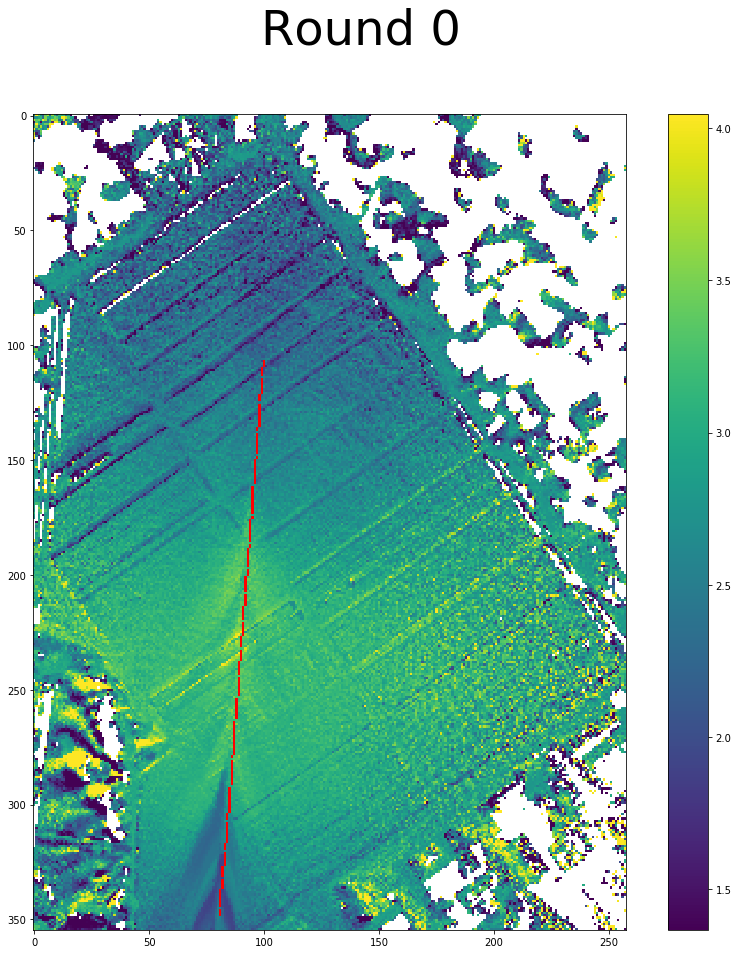

In [ ]:
fig, img_map = map_spike_rate_samples(MAP_FUNCTION.mean, neuro_data,
                                      [start_flight_lines_round_1[0]], [end_flight_lines_round_1[0]],
                                      camera_positions, title = "Round 0")